## ***Human Biological Age Prediction***

In [484]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
# Suppress all warnings
warnings.filterwarnings('ignore')

In [485]:
df = pd.read_csv('Dataset/Train.csv')
df.head()

,Gender,Height (cm),Weight (kg),Blood Pressure (s/d),Cholesterol Level (mg/dL),BMI,Blood Glucose Level (mg/dL),Bone Density (g/cm²),Vision Sharpness,Hearing Ability (dB),...,Family History,Cognitive Function,Mental Health Status,Sleep Patterns,Stress Levels,Pollution Exposure,Sun Exposure,Education Level,Income Level,Age (years)
0,Male,171.148359,86.185197,151/109,259.465814,29.423017,157.652848,0.132868,0.200000,58.786198,...,NaN,44.059172,Good,Insomnia,2.797064,5.142344,7.108975,NaN,Medium,89
1,Male,172.946206,79.641937,134/112,263.630292,26.626847,118.507805,0.629534,0.267312,54.635270,...,Heart Disease,45.312298,Good,Normal,9.339930,7.272720,3.918489,Undergraduate,Medium,77
2,Female,155.945488,49.167058,160/101,207.846206,20.217553,143.587550,0.473487,0.248667,54.564632,...,Hypertension,56.246991,Poor,Insomnia,9.234637,8.500386,5.393408,NaN,Medium,70
3,Female,169.078298,56.017921,133/94,253.283779,19.595270,137.448581,1.184315,0.513818,79.722963,...,Hypertension,55.196092,Poor,Insomnia,4.693446,7.555511,2.745578,NaN,Low,52
4,Female,163.758355,73.966304,170/106,236.119899,27.582078,145.328695,0.434562,0.306864,52.479469,...,NaN,53.023379,Good,Normal,4.038537,9.429097,3.878435,Undergraduate,High,79


In [486]:
df.isna().sum()

Gender                            0
Height (cm)                       0
Weight (kg)                       0
Blood Pressure (s/d)              0
Cholesterol Level (mg/dL)         0
BMI                               0
Blood Glucose Level (mg/dL)       0
Bone Density (g/cm²)              0
Vision Sharpness                  0
Hearing Ability (dB)              0
Physical Activity Level           0
Smoking Status                    0
Alcohol Consumption            1201
Diet                              0
Chronic Diseases               1299
Medication Use                 1198
Family History                 1451
Cognitive Function                0
Mental Health Status              0
Sleep Patterns                    0
Stress Levels                     0
Pollution Exposure                0
Sun Exposure                      0
Education Level                 627
Income Level                      0
Age (years)                       0
dtype: int64

In [487]:
df.shape

(3000, 26)

In [488]:
df.dtypes

Gender                          object
Height (cm)                    float64
Weight (kg)                    float64
Blood Pressure (s/d)            object
Cholesterol Level (mg/dL)      float64
BMI                            float64
Blood Glucose Level (mg/dL)    float64
Bone Density (g/cm²)           float64
Vision Sharpness               float64
Hearing Ability (dB)           float64
Physical Activity Level         object
Smoking Status                  object
Alcohol Consumption             object
Diet                            object
Chronic Diseases                object
Medication Use                  object
Family History                  object
Cognitive Function             float64
Mental Health Status            object
Sleep Patterns                  object
Stress Levels                  float64
Pollution Exposure             float64
Sun Exposure                   float64
Education Level                 object
Income Level                    object
Age (years)              

In [489]:
df['Alcohol Consumption'].value_counts()

Alcohol Consumption
Occasional    1057
Frequent       742
Name: count, dtype: int64

In [490]:
df['Alcohol Consumption'] = df['Alcohol Consumption'].fillna('Never')
df['Chronic Diseases'] = df ['Chronic Diseases'].fillna('None')
df['Medication Use'] = df ['Medication Use'].fillna('Never')
df['Family History'] = df ['Family History'].fillna('None')

In [491]:
df[['s BP', 'd BP']] = df['Blood Pressure (s/d)'].str.split('/', n=1, expand=True).astype(int)
df.head()

,Gender,Height (cm),Weight (kg),Blood Pressure (s/d),Cholesterol Level (mg/dL),BMI,Blood Glucose Level (mg/dL),Bone Density (g/cm²),Vision Sharpness,Hearing Ability (dB),...,Mental Health Status,Sleep Patterns,Stress Levels,Pollution Exposure,Sun Exposure,Education Level,Income Level,Age (years),s BP,d BP
0,Male,171.148359,86.185197,151/109,259.465814,29.423017,157.652848,0.132868,0.200000,58.786198,...,Good,Insomnia,2.797064,5.142344,7.108975,NaN,Medium,89,151,109
1,Male,172.946206,79.641937,134/112,263.630292,26.626847,118.507805,0.629534,0.267312,54.635270,...,Good,Normal,9.339930,7.272720,3.918489,Undergraduate,Medium,77,134,112
2,Female,155.945488,49.167058,160/101,207.846206,20.217553,143.587550,0.473487,0.248667,54.564632,...,Poor,Insomnia,9.234637,8.500386,5.393408,NaN,Medium,70,160,101
3,Female,169.078298,56.017921,133/94,253.283779,19.595270,137.448581,1.184315,0.513818,79.722963,...,Poor,Insomnia,4.693446,7.555511,2.745578,NaN,Low,52,133,94
4,Female,163.758355,73.966304,170/106,236.119899,27.582078,145.328695,0.434562,0.306864,52.479469,...,Good,Normal,4.038537,9.429097,3.878435,Undergraduate,High,79,170,106


In [492]:
df.dropna(inplace = True)

In [493]:
df.drop(['Blood Pressure (s/d)'], axis = 1, inplace = True)

In [494]:
df= df.drop_duplicates()

#### Univariate Analysis

In [495]:
df.describe()

,Height (cm),Weight (kg),Cholesterol Level (mg/dL),BMI,Blood Glucose Level (mg/dL),Bone Density (g/cm²),Vision Sharpness,Hearing Ability (dB),Cognitive Function,Stress Levels,Pollution Exposure,Sun Exposure,Age (years),s BP,d BP
count,2373.000000,2373.000000,2373.000000,2373.000000,2373.000000,2373.000000,2373.000000,2373.000000,2373.000000,2373.000000,2373.000000,2373.000000,2373.000000,2373.00000,2373.000000
mean,168.643225,72.709451,234.237652,25.594388,126.607842,0.936819,0.477835,46.850326,64.061200,5.442295,5.008262,5.979623,53.249895,145.91319,95.434471
std,9.258215,13.184716,24.235712,4.356711,18.194975,0.443348,0.209642,14.399245,11.729550,2.596519,2.850518,3.488257,20.579636,15.98363,9.938917
min,141.130985,32.537672,148.811514,13.376273,69.866884,-0.219787,0.200000,0.000000,30.382098,1.000428,0.006395,0.002055,18.000000,99.00000,60.000000
25%,161.811868,63.409616,217.020513,22.466101,114.470189,0.571657,0.284206,36.624648,55.799265,3.183180,2.610863,2.832844,36.000000,135.00000,89.000000
50%,168.283906,71.609216,234.585754,25.407069,126.565401,0.946746,0.467314,46.675126,64.208027,5.441893,5.068543,6.005563,53.000000,146.00000,95.000000
75%,175.518028,81.844994,250.568807,28.436909,139.150652,1.300860,0.643664,56.502836,72.317229,7.673418,7.404761,9.031177,72.000000,157.00000,102.000000
max,198.112215,123.598603,331.300589,40.417295,184.993757,1.999829,1.062537,94.003824,106.479831,9.996323,9.998090,11.992504,89.000000,193.00000,124.000000


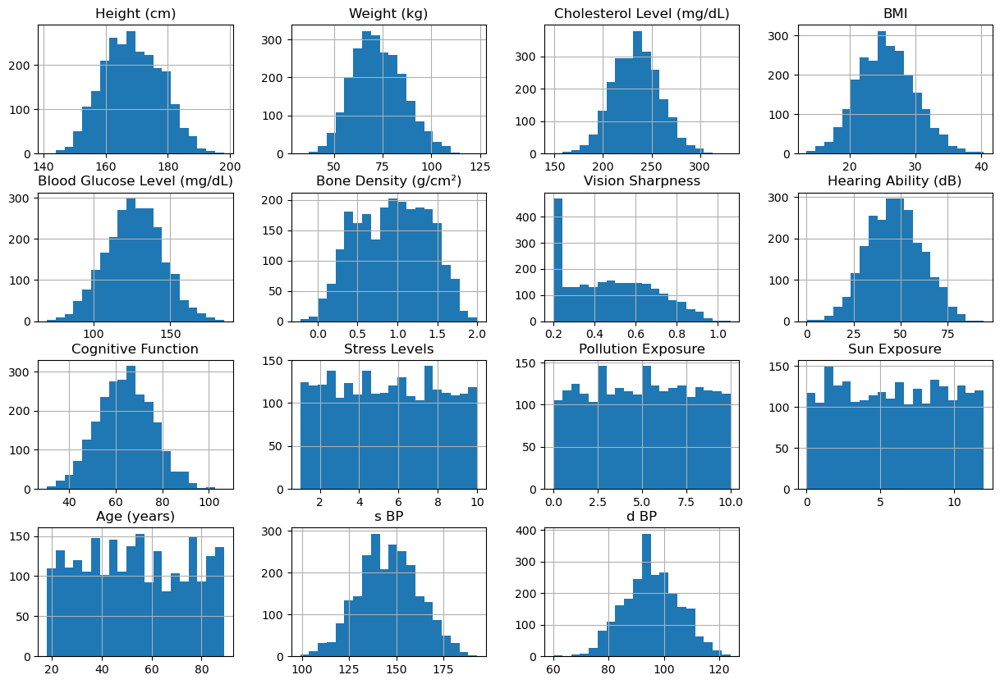

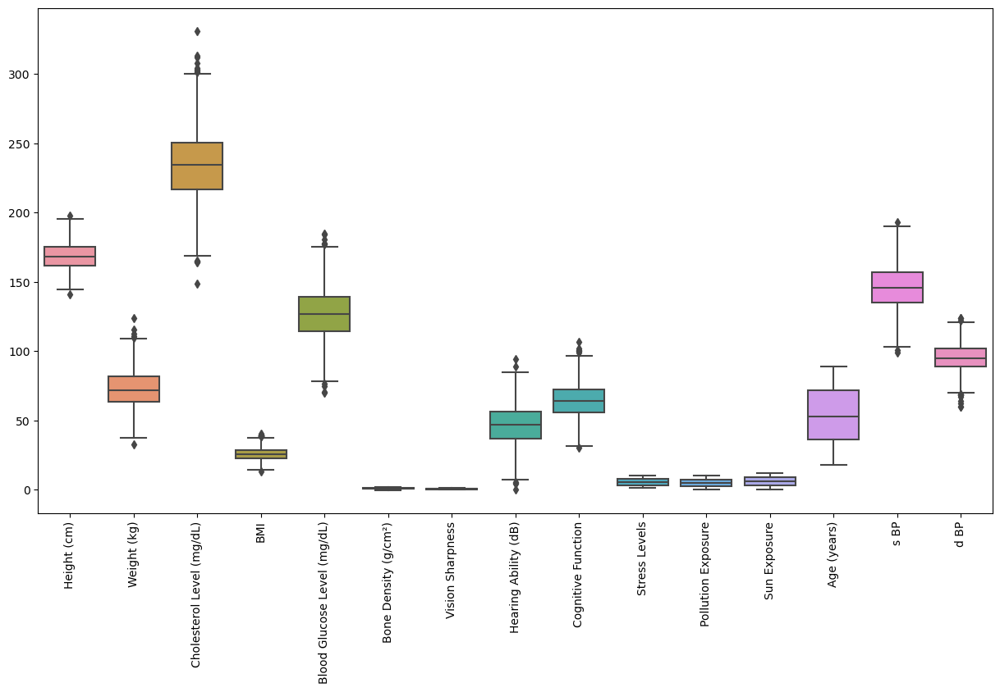

In [496]:
# Histograms for numerical variables
df.hist(bins=20, figsize=(15, 10))
plt.show()

# Box plots to visualize potential outliers
plt.figure(figsize=(15, 8))
sns.boxplot(data=df.select_dtypes(include=[np.number]))
plt.xticks(rotation=90)
plt.show()

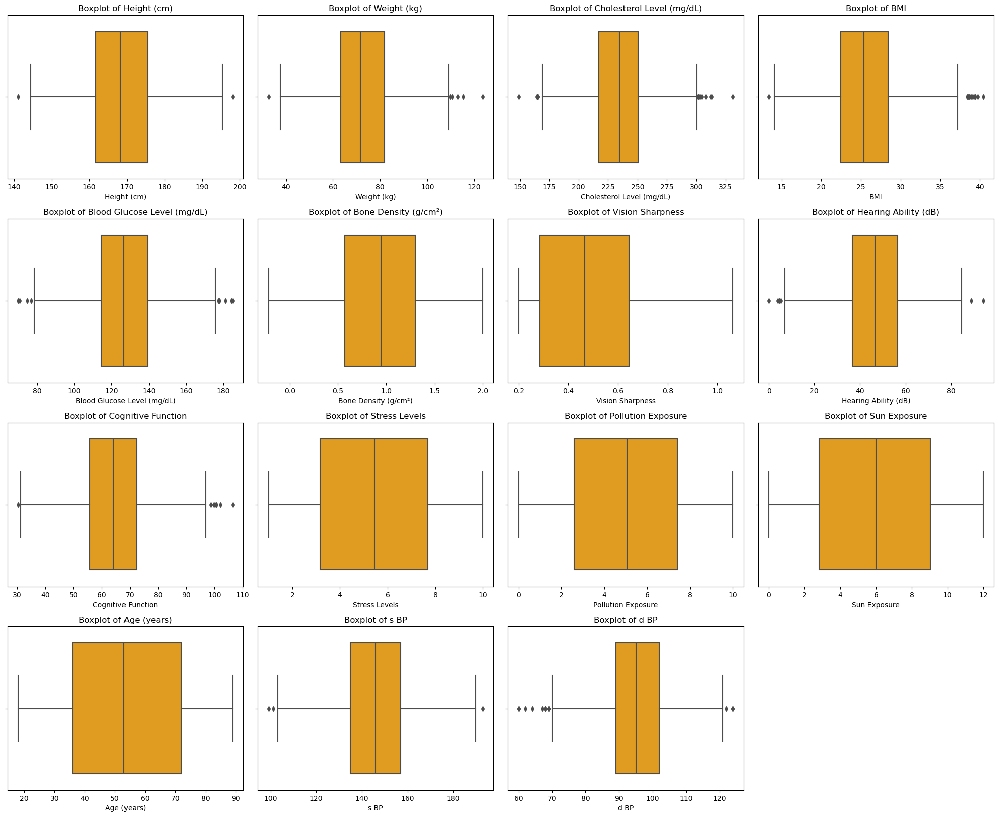

In [497]:
numeric_features = df.select_dtypes(include=[np.number]).columns.tolist()

plt.figure(figsize = (20,20))
for i, feature in enumerate(numeric_features, 1):
    plt.subplot(5, 4, i)
    sns.boxplot(x=df[feature], color='orange')
    plt.title(f'Boxplot of {feature}')
plt.tight_layout()
plt.show()

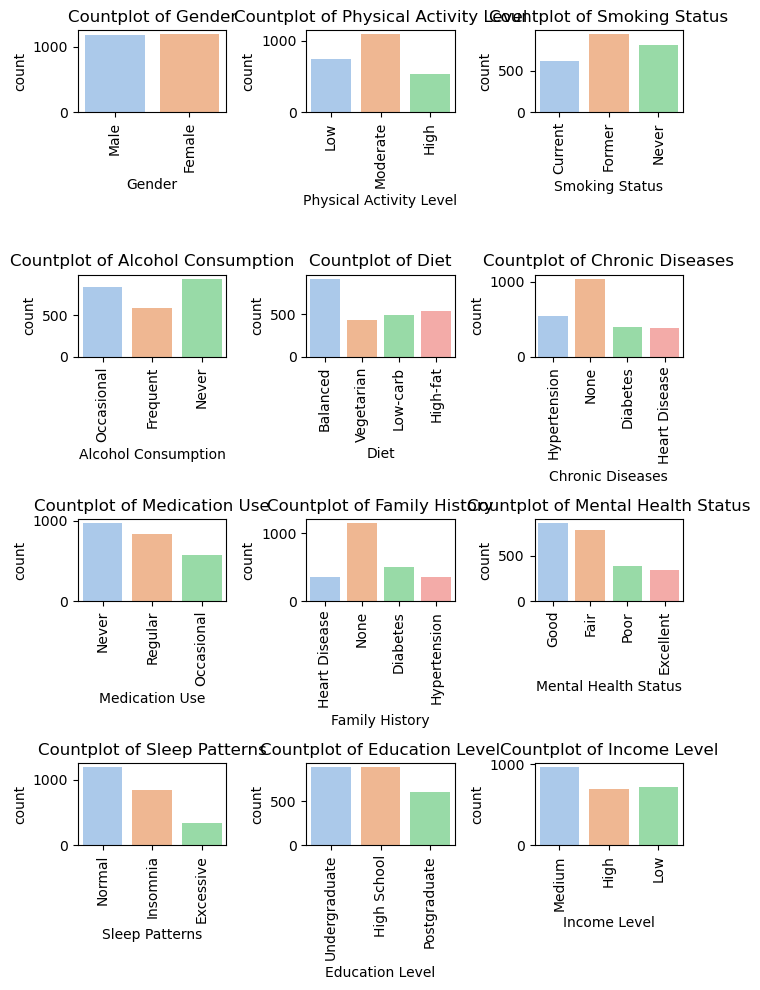

In [498]:
# Bar plots for categorical variables
categ_features = ['Gender', 'Physical Activity Level','Smoking Status' , 'Alcohol Consumption', 'Diet', 
                  'Chronic Diseases', 'Medication Use', 'Family History', 'Mental Health Status', 'Sleep Patterns', 
                  'Education Level' , 'Income Level']

plt.figure(figsize=(7, 10))
for i, feature in enumerate(categ_features, 1):
    plt.subplot(4, 3, i)
    sns.countplot(x=feature, data=df, palette='pastel')
    plt.title(f'Countplot of {feature}')
    plt.xticks(rotation=90)
plt.tight_layout()
plt.show()

 #### Bi-variate Analysis

<Figure size 1000x700 with 0 Axes>

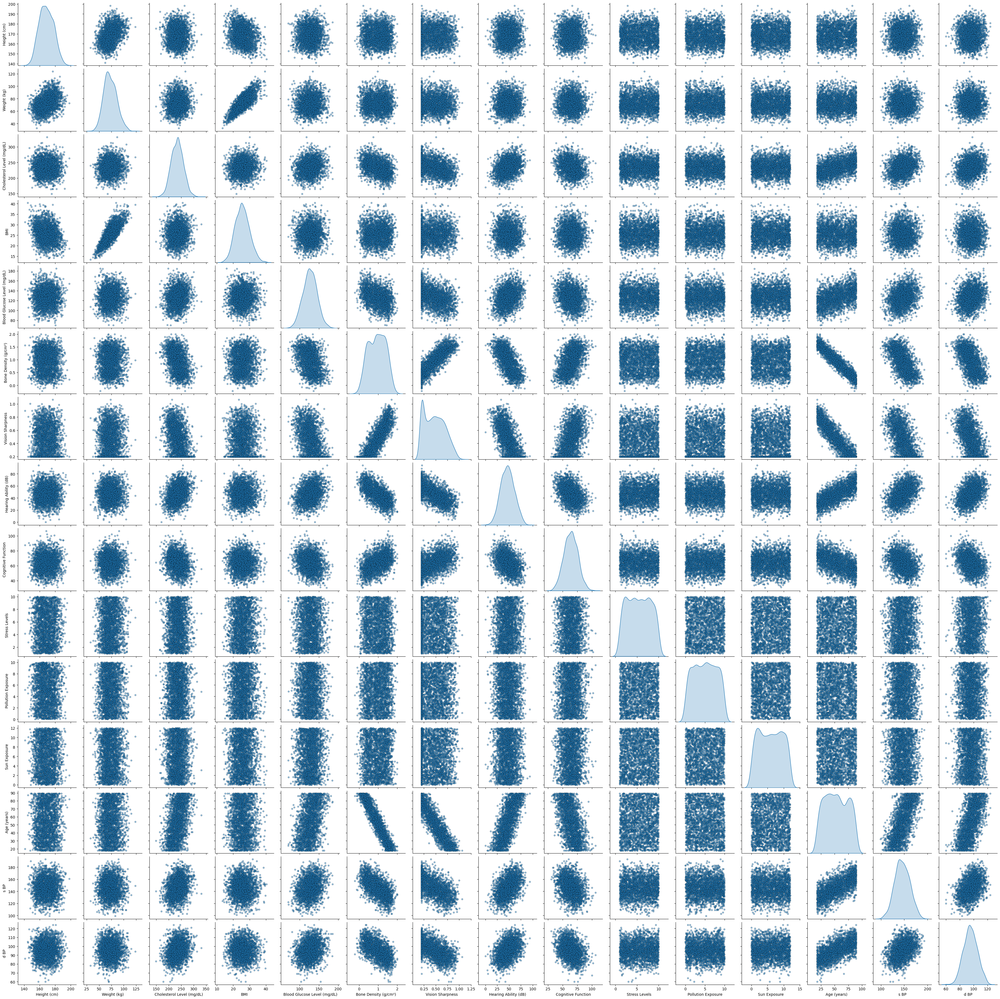

In [499]:
# Define numeric features by selecting only numeric columns
numeric_features = df.select_dtypes(include=[np.number]).columns.tolist()
# Scatter plots between numerical variables
plt.figure(figsize=(10, 7))
sns.pairplot(df[numeric_features], diag_kind='kde', plot_kws={'alpha':0.5, 's':20, 'edgecolor':'k'})
plt.show()

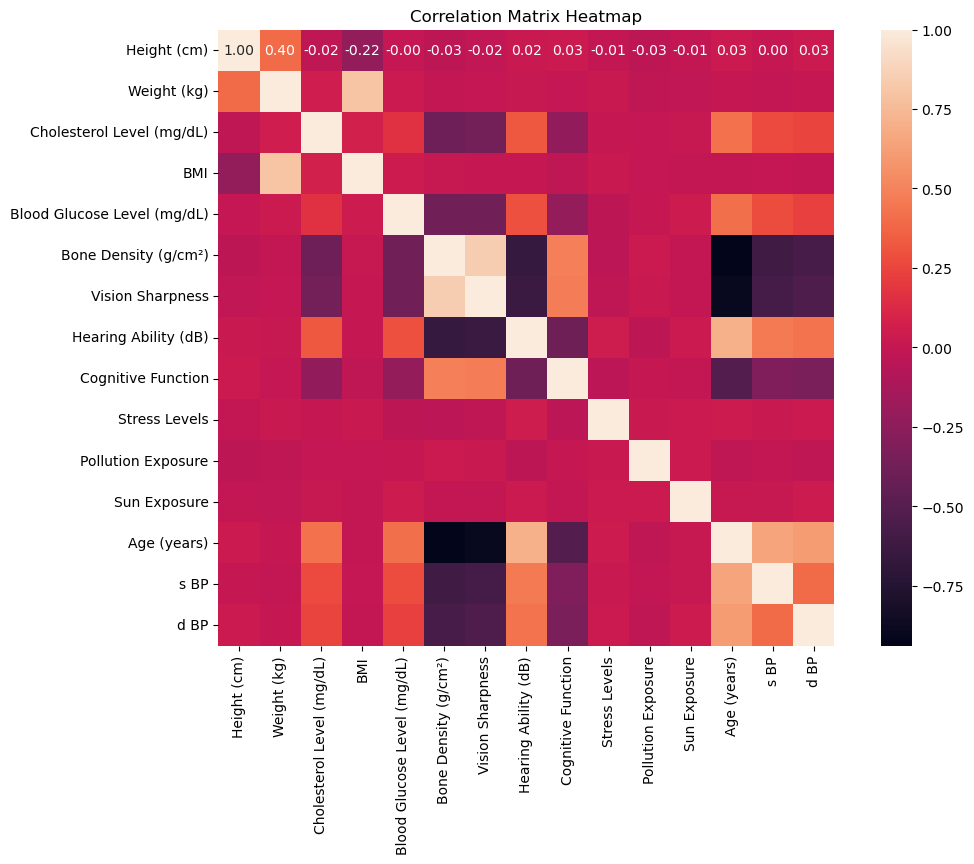

In [500]:
# Selecting only numeric columns for the correlation matrix
numeric_df = df.select_dtypes(include=[np.number])

# Correlation heatmap for numeric variables only
plt.figure(figsize=(12, 8))
sns.heatmap(numeric_df.corr(), annot=True, fmt='.2f', square =True)
plt.title('Correlation Matrix Heatmap')
plt.show()

In [501]:
x = df.drop(columns = ['Age (years)'])
y = df['Age (years)']

In [502]:
from sklearn.preprocessing import LabelEncoder
categorical_cols = x.select_dtypes(include=['object']).columns

le = LabelEncoder()
for col in categorical_cols:
    x[col] = le.fit_transform(df[col])

In [503]:
#Splitting the data into training and testing with a test size of 20%.
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.15, random_state=0)

In [504]:
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

In [505]:
models = [
    LinearRegression(),
    DecisionTreeRegressor(),
    RandomForestRegressor()
]   

In [506]:
for i, model in enumerate(models, start=1):
    model.fit(x_train, y_train)
    y_pred = model.predict(x_test)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    print(f"Model {i} MAE: {mae:.2f}")
    print(f"Model {i} R2 Score: {r2:.2f}")
    print(f"Model {i} MSE: {mse:.2f}")

Model 1 MAE: 4.21
Model 1 R2 Score: 0.93
Model 1 MSE: 26.74
Model 2 MAE: 6.09
Model 2 R2 Score: 0.85
Model 2 MSE: 62.88
Model 3 MAE: 4.53
Model 3 R2 Score: 0.92
Model 3 MSE: 31.50


In [507]:
from sklearn.ensemble import GradientBoostingRegressor

In [508]:
model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, random_state=0)
model.fit(x_train, y_train)
y_pred = model.predict(x_test)

In [509]:
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
print("Mean Squared Error:", mse)
print("Mean Absolute Error:", mae)

Mean Squared Error: 28.34307497710223
Mean Absolute Error: 4.252860610743765


In [510]:
#The results shows that the best performing model is Linear Regression.
#Lets predict the test data based on trained model.

In [511]:
test = pd.read_csv('Dataset/Test.csv')
test.head()

,Gender,Height (cm),Weight (kg),Blood Pressure (s/d),Cholesterol Level (mg/dL),BMI,Blood Glucose Level (mg/dL),Bone Density (g/cm²),Vision Sharpness,Hearing Ability (dB),...,Medication Use,Family History,Cognitive Function,Mental Health Status,Sleep Patterns,Stress Levels,Pollution Exposure,Sun Exposure,Education Level,Income Level
0,Male,171.148359,86.185197,151/109,259.465814,29.423017,157.652848,0.132868,0.200000,58.786198,...,NaN,NaN,44.059172,Good,Insomnia,2.797064,5.142344,7.108975,NaN,Medium
1,Male,172.946206,79.641937,134/112,263.630292,26.626847,118.507805,0.629534,0.267312,54.635270,...,NaN,Heart Disease,45.312298,Good,Normal,9.339930,7.272720,3.918489,Undergraduate,Medium
2,Female,155.945488,49.167058,160/101,207.846206,20.217553,143.587550,0.473487,0.248667,54.564632,...,Regular,Hypertension,56.246991,Poor,Insomnia,9.234637,8.500386,5.393408,NaN,Medium
3,Female,169.078298,56.017921,133/94,253.283779,19.595270,137.448581,1.184315,0.513818,79.722963,...,Occasional,Hypertension,55.196092,Poor,Insomnia,4.693446,7.555511,2.745578,NaN,Low
4,Female,163.758355,73.966304,170/106,236.119899,27.582078,145.328695,0.434562,0.306864,52.479469,...,NaN,NaN,53.023379,Good,Normal,4.038537,9.429097,3.878435,Undergraduate,High


In [512]:
test.isna().sum()

Gender                            0
Height (cm)                       0
Weight (kg)                       0
Blood Pressure (s/d)              0
Cholesterol Level (mg/dL)         0
BMI                               0
Blood Glucose Level (mg/dL)       0
Bone Density (g/cm²)              0
Vision Sharpness                  0
Hearing Ability (dB)              0
Physical Activity Level           0
Smoking Status                    0
Alcohol Consumption            1201
Diet                              0
Chronic Diseases               1299
Medication Use                 1198
Family History                 1451
Cognitive Function                0
Mental Health Status              0
Sleep Patterns                    0
Stress Levels                     0
Pollution Exposure                0
Sun Exposure                      0
Education Level                 627
Income Level                      0
dtype: int64

In [513]:
test['Alcohol Consumption'] = test['Alcohol Consumption'].fillna('Never')
test['Chronic Diseases'] = test ['Chronic Diseases'].fillna('None')
test['Medication Use'] = test ['Medication Use'].fillna('Never')
test['Family History'] = test ['Family History'].fillna('None')

In [514]:
test[['s BP', 'd BP']] = test['Blood Pressure (s/d)'].str.split('/', n=1, expand=True).astype(int)
test.dropna(inplace = True)
test.drop(['Blood Pressure (s/d)'], axis = 1, inplace = True)
test= test.drop_duplicates()

In [515]:
test.shape

(2373, 26)

In [516]:
from sklearn.preprocessing import LabelEncoder
categorical_cols = test.select_dtypes(include=['object']).columns

le = LabelEncoder()
for col in categorical_cols:
    test[col] = le.fit_transform(test[col])

In [517]:
model = LinearRegression()
model.fit(x_train, y_train)

LinearRegression()

In [518]:
result = model.predict(test)
result

array([70.99886186, 75.40702147, 28.40319117, ..., 15.20133167,
       78.67171735, 59.10005144])

In [519]:
test['Predicted Age'] = result

In [520]:
test.head(10)

,Gender,Height (cm),Weight (kg),Cholesterol Level (mg/dL),BMI,Blood Glucose Level (mg/dL),Bone Density (g/cm²),Vision Sharpness,Hearing Ability (dB),Physical Activity Level,...,Mental Health Status,Sleep Patterns,Stress Levels,Pollution Exposure,Sun Exposure,Education Level,Income Level,s BP,d BP,Predicted Age
1,1,172.946206,79.641937,263.630292,26.626847,118.507805,0.629534,0.267312,54.635270,1,...,2,2,9.339930,7.272720,3.918489,2,2,134,112,70.998862
4,0,163.758355,73.966304,236.119899,27.582078,145.328695,0.434562,0.306864,52.479469,1,...,2,2,4.038537,9.429097,3.878435,2,0,170,106,75.407021
5,1,174.891617,79.671483,198.718529,26.047432,100.928108,1.435352,0.666739,27.908177,1,...,1,1,3.138738,7.282163,4.413398,2,2,134,75,28.403191
6,1,178.586966,86.521864,246.339736,27.128536,129.977078,0.577363,0.200000,63.363360,2,...,2,1,8.355000,5.552008,6.355807,0,1,178,109,79.554851
8,0,164.546917,74.405356,204.235608,27.480504,137.022297,1.047384,0.505928,54.105122,2,...,1,1,1.392434,9.945505,5.639334,0,0,152,119,54.691983
9,0,164.839426,64.271711,268.598653,23.653623,130.056457,0.321093,0.200000,65.601092,2,...,3,0,7.273142,7.024841,4.313894,0,0,153,109,83.018521
12,1,173.338256,102.464068,289.219136,34.102228,124.845940,0.651341,0.402461,84.370333,2,...,1,2,2.156503,8.112042,9.847674,2,0,145,108,70.886027
13,0,159.081403,67.075983,193.210429,26.505025,102.106584,1.792692,0.745991,37.794355,1,...,1,2,3.250148,5.805440,10.405399,2,1,151,79,19.286376
14,1,180.777914,89.762116,220.229793,27.466438,139.479575,1.024116,0.615397,40.789595,0,...,1,1,8.124211,7.896181,1.094473,0,1,143,101,48.339517
15,1,187.695666,84.854995,210.693196,24.086235,118.478411,1.563866,0.827254,44.543543,0,...,2,0,2.000777,4.926251,0.136244,0,1,140,98,27.695197


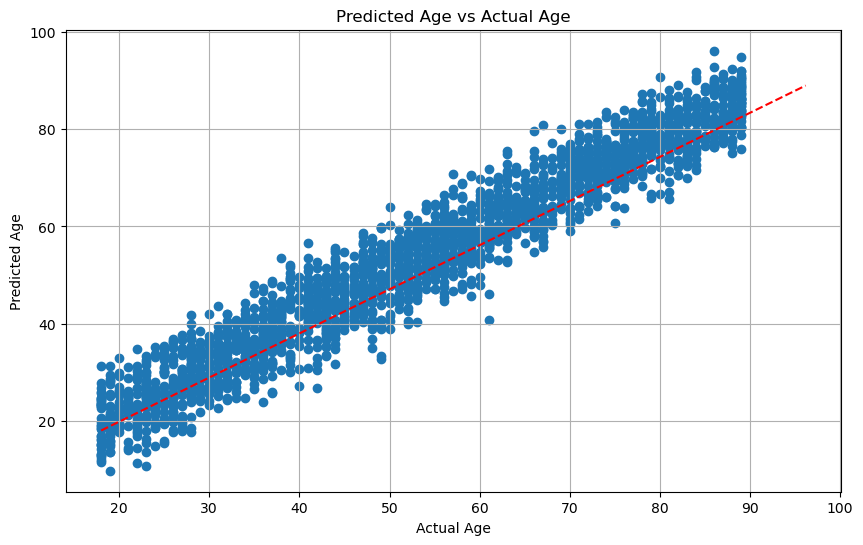

In [521]:
plt.figure(figsize=(10, 6))
plt.scatter(df['Age (years)'], test['Predicted Age'])
plt.plot([df['Age (years)'].min(), test['Predicted Age'].max()], [df['Age (years)'].min(), df['Age (years)'].max()], 'r--')
plt.xlabel('Actual Age')
plt.ylabel('Predicted Age')
plt.title('Predicted Age vs Actual Age')
plt.grid()
plt.show()

In [522]:
df.columns

Index(['Gender', 'Height (cm)', 'Weight (kg)', 'Cholesterol Level (mg/dL)',
       'BMI', 'Blood Glucose Level (mg/dL)', 'Bone Density (g/cm²)',
       'Vision Sharpness', 'Hearing Ability (dB)', 'Physical Activity Level',
       'Smoking Status', 'Alcohol Consumption', 'Diet', 'Chronic Diseases',
       'Medication Use', 'Family History', 'Cognitive Function',
       'Mental Health Status', 'Sleep Patterns', 'Stress Levels',
       'Pollution Exposure', 'Sun Exposure', 'Education Level', 'Income Level',
       'Age (years)', 's BP', 'd BP'],
      dtype='object')

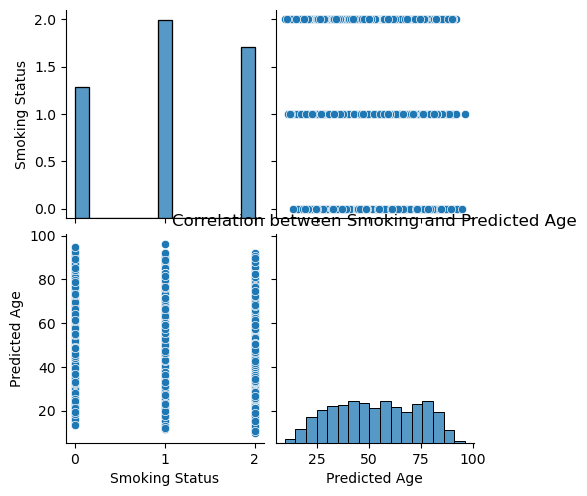

In [523]:
sns.pairplot(test, vars =['Smoking Status','Predicted Age'])
plt.xlabel('Smoking')
plt.ylabel('Predicted Age')
plt.title('Correlation between Smoking and Predicted Age')
plt.grid()
plt.show()